<div style="font-size: 60px;padding: 200fpx;">
    
<center>
    
**PROGETTO DMML 2024**
    
<span style="font-size: 30px;padding: 200fpx;">
    
*Clustering*
</span>
</center>
    
    
<span style="font-size: 18px;padding: 200fpx;">

Alessandrelli Andrea, Antonini Luca, Cofrancesco Angela
    
</span>

</div>

***
***
***

# **Indice**



<span style="font-size: 18px;">
    
<div class="alert alert-block alert-warning">
    
- [Librerie e funzioni utili](#**Librerie-e-funzioni-utili**)


- [Clustering](#**Clustering**)
    - [Means methods](##**Means-methods**)
    - [DBSCAN](##**DBSCAN**)
    - [Clustering Gerarchico](##**Gerarchical**)

</div>
</span>

Abbiamo deciso di dividere ogni notebook in due macrosezioni: la prima parte più descrittiva, in cui si tiene traccia attraverso grafici, immagini e parole, dei passaggi e delle strategie adoperate e dei risultati ottenuti, e una seconda parte, complementare alla prima, in cui viene presentato il codice.

***
***
***

# **Librerie e funzioni utili**

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from scipy.stats import pearsonr
from scipy.stats import norm
import seaborn as sns
# per mostrare tutte le colonne
from IPython.display import display

In [4]:
# per la normalizzazione e la standardizzazione dei dati
from sklearn.preprocessing import MinMaxScaler, StandardScaler
# utile nel caso fosse necessario applicare la PCA
from sklearn.decomposition import PCA

In [5]:
# utile per la Stratified K Fold Cross Validation
from sklearn.model_selection import RepeatedStratifiedKFold, StratifiedKFold, RepeatedKFold

In [6]:
# per lo split tra training e test set
from sklearn.model_selection import train_test_split
# per utilizzare la random search e la grid search
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [7]:
# per KMeans e Bisecting KMeans
from sklearn.cluster import KMeans
from sklearn.cluster import BisectingKMeans
# utili per i cluster di tipo gerarchico
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.neighbors import kneighbors_graph

from scipy.spatial import distance
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import silhouette_score


# per il DBSCAN
from sklearn.cluster import DBSCAN


# per plottare i vari grafi
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.neighbors import kneighbors_graph

In [8]:
# per salvare i parametri di training
from joblib import dump, load

In [9]:
import warnings

# disabilita tutti i warning
warnings.filterwarnings("ignore")

<div style="font-size: 25px;padding: 20fpx;">

**Funzioni utili**
</div>

In [10]:
# funzione che prende in INPUT una colonna di un dataframe e da in OUTPUT la percentuale di outliers presenti
def perc_outlier(x):
    q1 = np.quantile(x, 0.25)
    q3 = np.quantile(x, 0.75)
    iqr = q3 - q1
    # lista delle colonne con outliers
    outliers = list()
    for v in x:
        if v < q1 - 1.5 * iqr or v > q3 + 1.5 * iqr:
            outliers.append(True)
        else:
            outliers.append(False)

    # restituisce la percentuale di outliers presenti nella colonna x
    return np.array(outliers).sum()/len(x)

In [11]:
# funzione che restituisce le colonne con correlazione >delta o <delta

def coor_map(df, delta):
    correlation_matrix =df.corr(numeric_only=True)

    # lista con il nome delle due colonne coinvolte e il relativo valore di correlazione
    highly_correlated_columns = list()
    for column in correlation_matrix.columns:
      high_corr = list(correlation_matrix.index[np.abs(correlation_matrix[column]) >= delta])

      high_corr.remove(column)
      for hh in high_corr:
          highly_correlated_columns.append([column, hh, correlation_matrix[column][hh]])
    # ordinamento in base al valore della correlazione
    highly_correlated_columns=sorted(highly_correlated_columns, key= lambda x:x[2], reverse=True)

# eliminazione dei doppioni poiché la coor_matrix è simmetrica
    # Lista per tenere traccia delle tuple già viste
    seen = set()
    filtered_data = []
    for item in  highly_correlated_columns:
    # Ordina la tupla dei primi due elementi in modo da standardizzare l'ordine
        sorted_pair = tuple(sorted(item[:2]))
    # Se la tupla non è già stata vista, aggiunge l'elemento ai dati filtrati e segna la tupla come vista
        if sorted_pair not in seen:
            filtered_data.append(item)
            seen.add(sorted_pair)
# restituisce un array con ogni elemento della forma ['colonna_x', 'colonna_y', correlazione_xy]
    return filtered_data

In [12]:
# tra le colonne numeriche, salviamo in cc quelle che hanno una percentuale di outliers maggiore del valore soglia
def rimoz_outliers(df, soglia):
    col_num = df.select_dtypes(exclude='bool').columns
    col_da_scartare = []
    for c in col_num:
        controll = perc_outlier(df[c])*100
        if controll > soglia:
            col_da_scartare.append(c)

    df_No_out = df[df.columns.drop(col_da_scartare)]
    return df_No_out

In [13]:
pd.options.display.max_columns = None # per visualizzare tutte le colonne

---
---
---

<div style="font-size: 20px;padding: 200fpx;">

# **Clustering**

</div>

***
***

<center>
<div style="font-size: 30px;padding: 200fpx;">

## **Discussione**

</div>

</center>

<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">
    
In questa sezione analizzeremo i tre diversi algoritmi di clustering utilizzati:
* K-Means
* DBSCAN
* Hierarchical clustering

Di ogni algoritmo è stata usata l’implementazione in *sklearn*, andandoci a focalizzare solo sui 15 attributi, contraddistinti da variabili continue, che abbiamo selezionato dopo la fase iniziale di preprocessing.

</div>

<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: right;">
    
**K-Means**

Per questo algoritmo di clustering ci si è concentrati soglo sugli attributi di tipo numerico, scartando quelli di tipo categorico. Inoltre tra tutti gli attributi numerici si è selezionato solo quelli che presentavano una percentuale di outliers inferiori all'1%, andando quindi a lavorare esclusivamente con:


*   length_ms
*   mfcc_mean
*   mfcc_max
*   kur
*   PCA1

Andando a plottare sia l'SSE che la Silhouette per un diverso valore di k ($k\in[2;26]$)

</div>

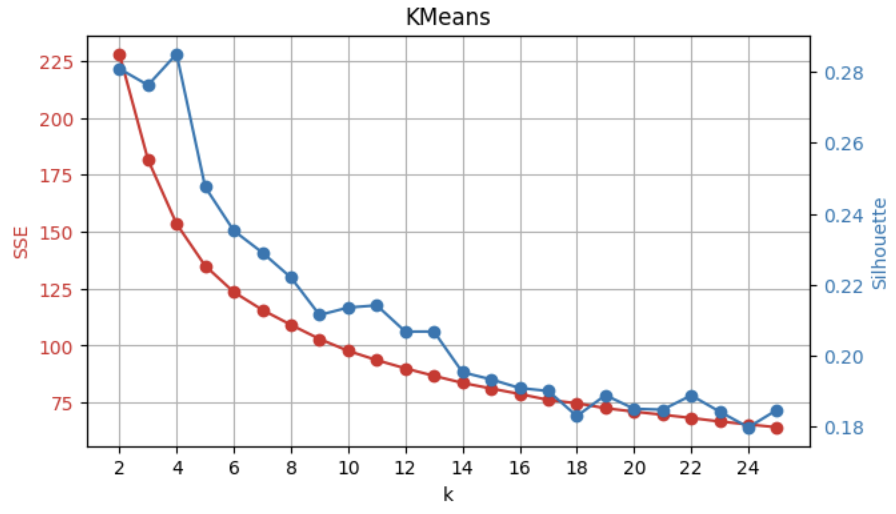



> plot dell'andamento dell'SSE (asse delle ordinate di sinistra, in rosso) e del coefficiente di silhouette (asse delle ordinate di destra, in blu) in funzione del numero di centroidi per l'algoritmo di clusterizzazione K Means


<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">


si è scelto come valore ottimale $k=8$, poichè tale punto si trova approssimativamente vicino al gomito della curva SSE.

Riportiamo di seguito una rappresentazione, in forma di scatter plot, di alcuni attributi separati per cluster e i relativi centroidi

</div>


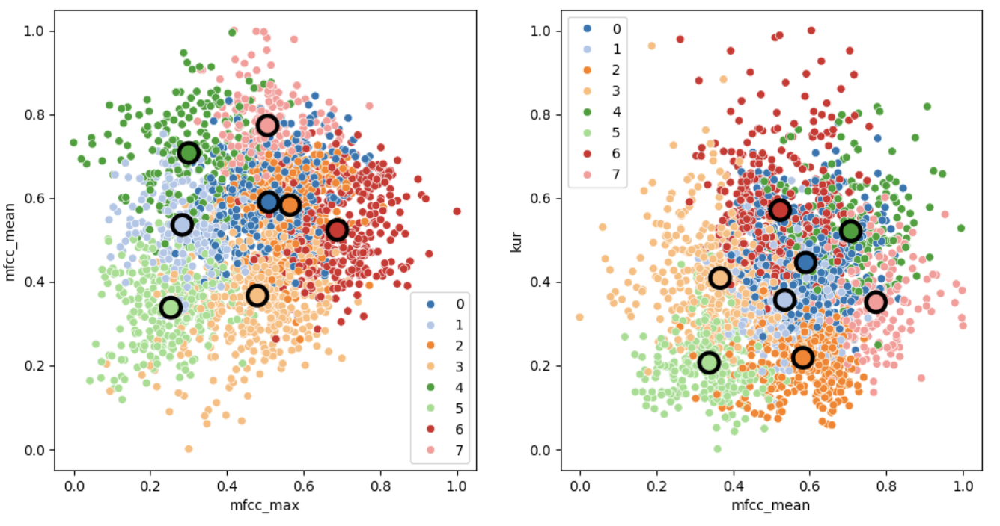

> Scatter plot degli attributi 'mfcc_max' e 'mfcc_mean'  (sinistra) e 'mfcc_mean' e 'kur' (destra) separati con diversi colori in base ai cluster ricavati con il k-means con $k=8$ a cui si sono sovrapposti gli 8 centroidi ricavati per ogni cluster



<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">
    
Inoltre, presentiamo l'andamento dei valori dei centroidi per gli attributi che prendono parte alla clusterizzazione

</div>

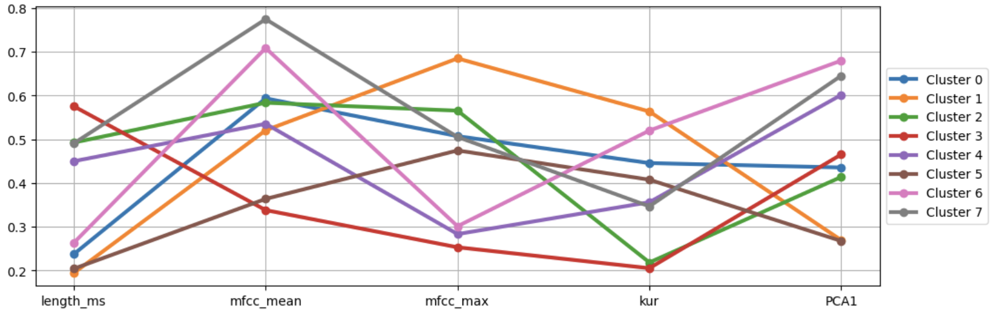



> Plot della variazione degli attributi relativi agli 8 centroidi ricavati dall'algoritmo di K Means



<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">
    
È stata analizzata anche la distribuzione dell'attributo 'emotion' nei $7$ cluster prodotti. Da questa analisi non sono emerse distinzioni evidenti, poiché le emozioni sembrano essere distribuite in maniera più o meno uniforme in tutti i cluster.

</div>

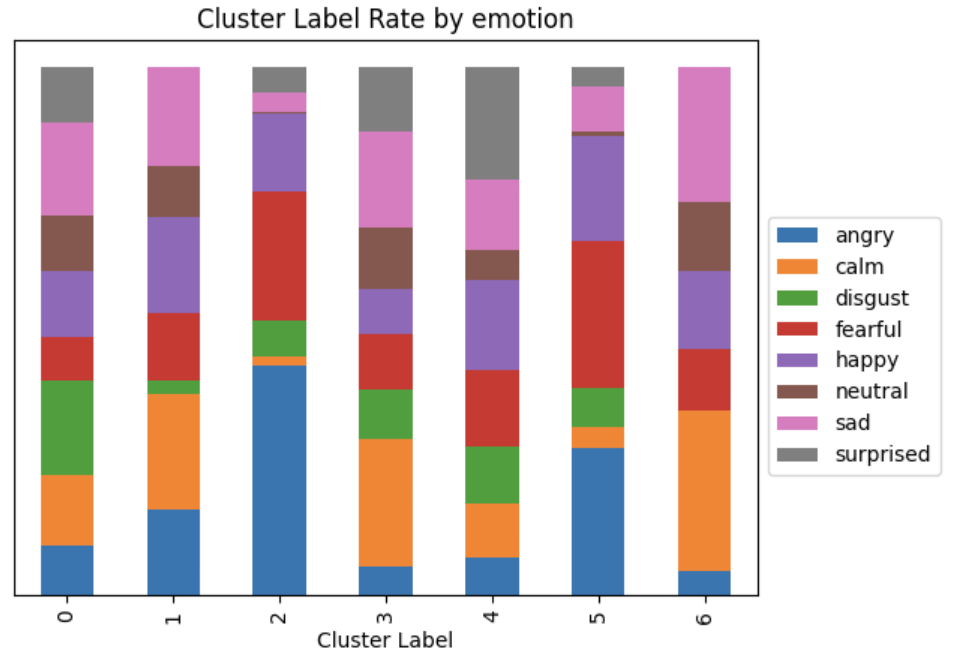



> Distribuzione dell'attributo 'emotion' (soggetto della classificazione della sezione seguente) all'interno dei $7$ cluster trovati con K Means



<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">
    
Una cosa interessante da notare è la presenza di un picco della silhuette per $k=4$, anche se a tale valore corrisponde una valore di SSE ancora abbastanza alto rispetto al valore di $k$ da noi scelto.



---

**DBSCAN**

Come proceduto per il K-Means si sono considerate solo le variabili numeriche con una percentuale di outliers minore dell'1%.

Successivamente al variare dei min_samples abbiamo identificato il valore di eps usando la funzione *dbscan_k_eps* in modo tale che al massimo solo il 10% dei dati vengano considerati come *noise* dall'algoritmo.



Come si evince dalle nostre analisi sembrerebbe che il DBSCAN non dia buoni risultati sul dataset in esame, questo probabilmente è dovuto al fatto che non sono presenti zone a diversa densità che separano i nostri dati e infatti l'algoritmo tende ad raggruppare i dati in un'unica classe, come si evince dal seguente grafico dove abbiamo graficato in un unico plot sia la silhouette che in numero di cluster trovati dall'algoritmo

</div>

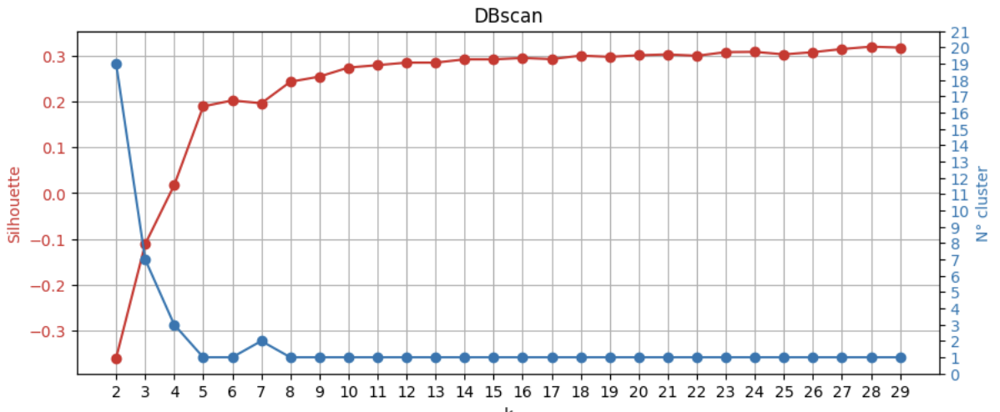



> Plot dell'andamento della silhouette (asse delle ordinate di sinistra in rosso) e del numero totale di cluster individuati dall'algoritmo di clusterizzazione DBSCAN (asse delle ordinate di destra in blu) in funzione del numero di primi vicini. In questo caso, l'eps è stato settato in modo da avere solo il 10% dei punti esclusi come punti noise.




<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">

    
il picco osservato a $k=7$ sebbene corrisponda a una divisione del dataset in due cluster esso corrisponde a un caso di due cluster fortemente sbilanciati:

- Cluster: 0, N° record: 2388
- Cluster: 1, N° record: 8
- N° Noise record: 50

Ovviamente in questa sitazione andare ad osservare la silhoette diventa abbastanza inutile dato che il suo valore tenderà a crescere essendo tutti i punti uniti in un unico grande cluster.

L'unico modo per avere una divisione significativa è ammerrere una percentuale di punti di noise più elevata. Diminuendo la soglia del nostro algoritmo di individuazione del eps a 0.75, e di conseguenza aumentano il numero di punti che potrebbero essere classificati come noise otteniamo il seguente andamento


</div>

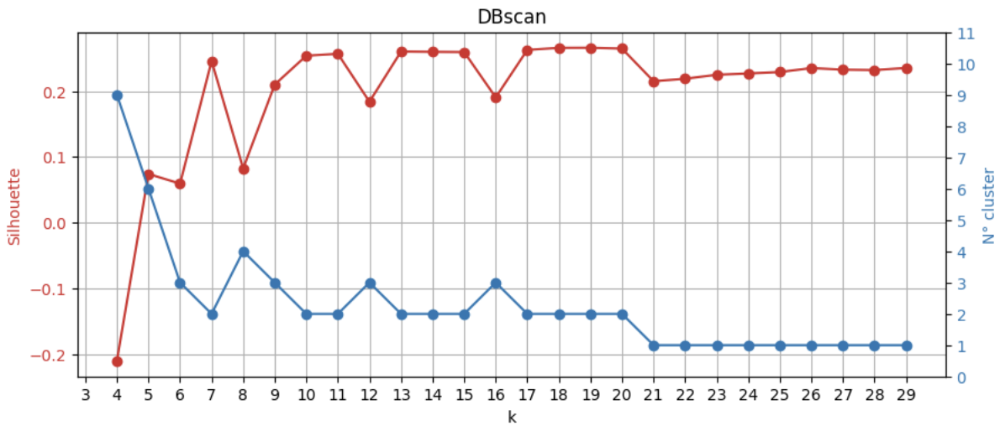



> PLOT DELL'ANDAMENTO DELLA SILHOUETTE (ASSE DELLE ORDINATE DI SINISTRA IN ROSSO) E DEL NUMERO TOTALE DI CLUSTER INDIVIDUATI DALL'ALGORITMO DI CLUSTERIZZAZIONE DBSCAN (ASSE DELLE ORDINATE DI DESTRA IN BLUE) IN FUNZIONE DEL NUMERO DI PRIMI VICINI. IN QUESTO CASO L'eps E' STATO SETTATO IN MODO DA AVERE IL 25% DEI PUNTI ESCLUSI COME PUNTI DI NOISE




<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">


Ciò sottolinea ancora di più l'inefficacia del DBSCAN su questo tipo di dataset. Riportiamo comunque il caso di $k=10$ come esempio, dove sebbene il valore di silhouette è superiore a 0.25 l'algoritmo identifica solo due tipi di cluster

*   Cluster: 0, N° record: 981
*   Cluster: 1, N° record: 1235


---

**Gerarchico**


Per il caso gerarchico si sono considerate solo le variabili numeriche con una percentuale di outliers minore dell'1%.

Si è proceduto ad analizzare per due diversi tipi di metriche: *euclidea* e *cityblock* e per diversi tipi di linkage: *complete*, *average*, *single* e *ward*(solo per *euclidea*) l'andamento della silhouette per andare a determinare la profondità a cui procedere con il taglio del dendrogramma.


Iniziando dal caso di metrica euclidea, riportiamo di seguito l'andamento della silhouette per diverse profondità ($k$) del dendrogramma per i diversi tipi di lonkage sotto esame

</div>

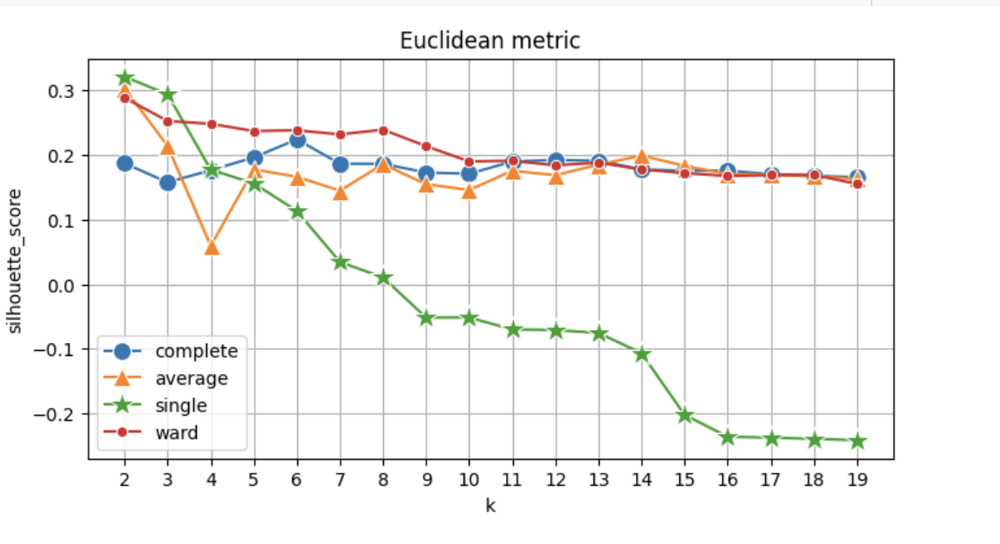



> Plot dell'andamento della silhouette in funzione del numero di cluster $k$ per l'algoritmo di classificazione gerarchica, per diversi tipi di linkage. In questo caso, la metrica adottata è quella *euclidea*.



<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">


Riportiamo di seguito i dendrogrammi ottenuti per la metrica euclidea (prima riga da destra a sinistra: 'complete linkage' e 'ward linkage'; seconda riga da destra a sinistra: 'average' e 'single' linkage)

</div>

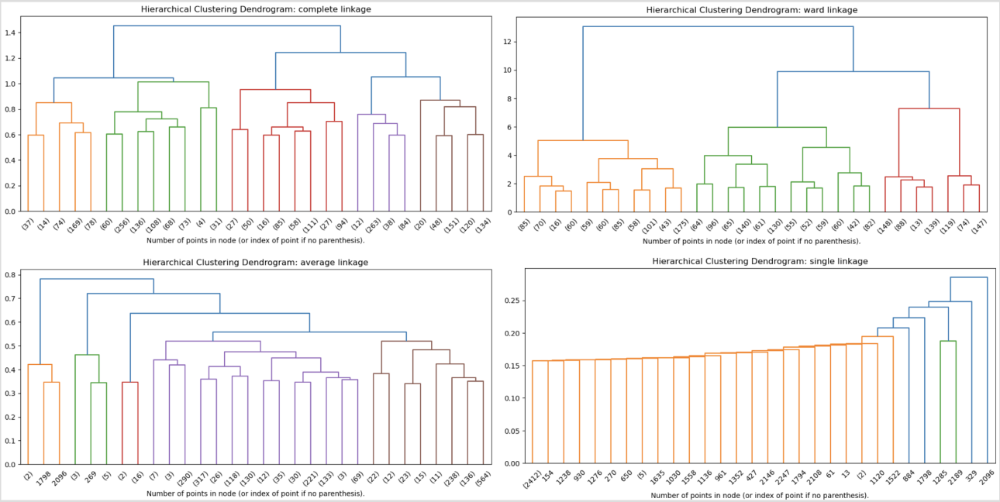



> Dendrogrammi completi per la clusterizzazione gerarchica con metrica 'cityblock' rispettivamente per i linkage di tipo: 'complete', 'average' e 'single'.


<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">

E i rispettivi dendrogrammi con gli appositi tagli che sono stati effettuati basandosi sui valori della silhouette per ottenere un numero totale di 6 cluster

</div>

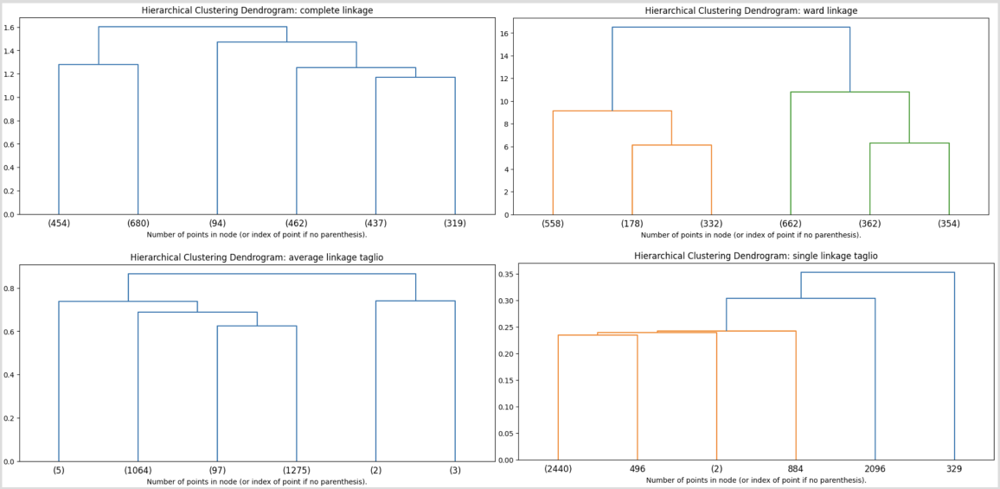



> Dendrogrammi per la clusterizzazione gerarchica con metrica euclidea, rispettivamente per linkage di tipo: 'complete', 'ward', 'average' e 'single'. Tagliati per ottenere 6 cluster ognuno.

<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">


Sia dalla distribuzione più uniforme dei record all'interno dei cluster che se si vanno a guardare gli scatterplot (che riportiamo di seguito), i migliori algoritmi di clusterizzazione risultano quelli bastati sulla 'complete linkage' e sul 'ward linkage'

</div>

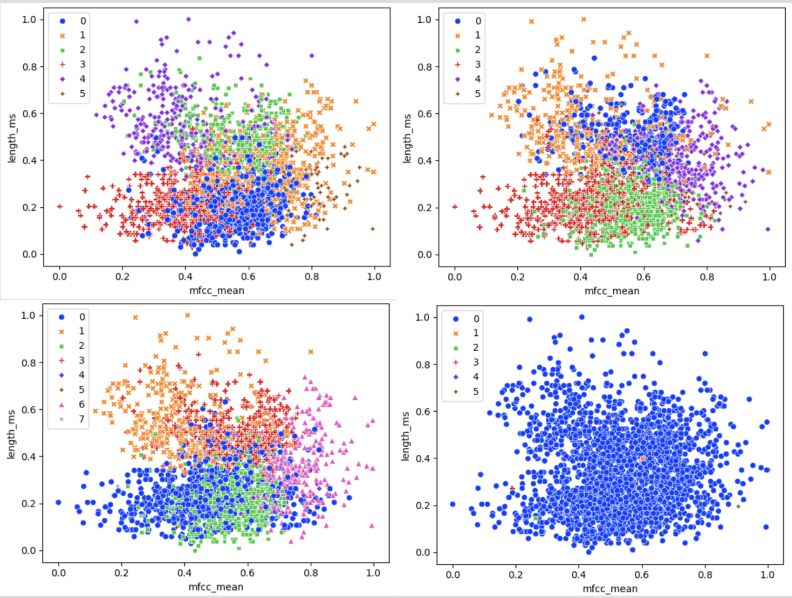



> Scatter plot di 'length_ms' e 'mfcc_mean' con colorazione in base alla clusterizzazione gerarchica ottenuta (da sinistra a destra per la prima riga: complete e ward; da sinistra e destra per la seconda riga: average e single)



<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">


Per il caso di metrica della forma 'city block' si ottiene il seguente grafico della silhouette

</div>

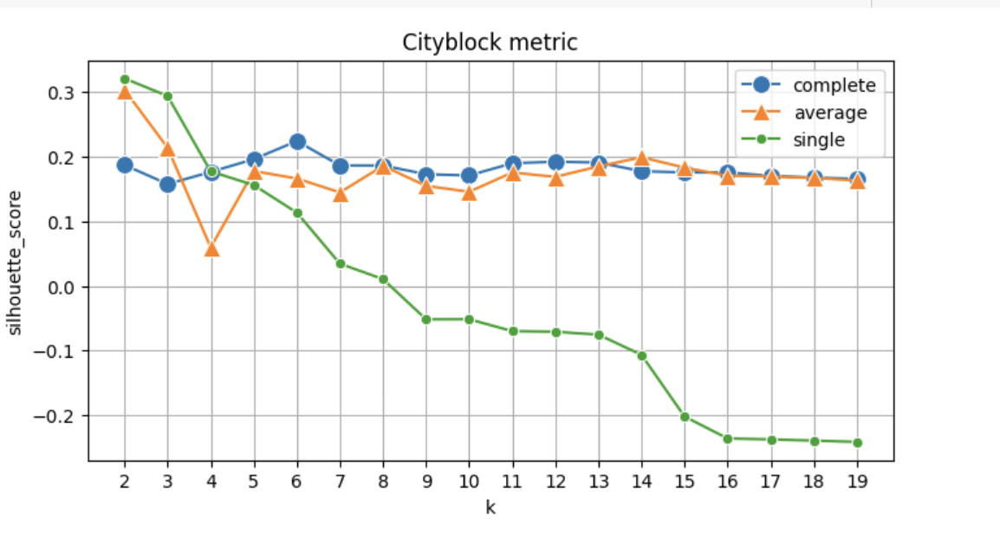



> Plot dell'andamento della silhouette in funzione del numero di cluster $k$, per l'algoritmo della classificazione gerarchica, per diversi tipi di linkage. In questo caso la metrica adottata è la *cityblock*.


<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">


Riportiamo i vari dendrogrammi già appositamente tagliati sulla base della silhouette, segliendo un valore di $k=8$ sia per 'average' che per 'complete' e invece $k=4$ per 'single'


</div>

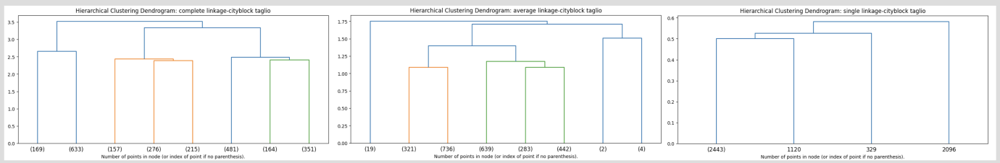



> Dendrogrammi per la clusterizzazione gerarchica con metrica 'cityblock' rispettivamente per i linkage di tipo: 'complete', 'average' e 'single', tagliati per ottenere, rispettivamente, 8, 8 e 4 cluster.



<div style="background-color: #E1F5FE; border: 2px solid #01579B; padding: 10px; display: block; float: left;">


Anche in questo caso, sia per i valori della silhouette che per maggiore uniformità di distribuzione dei record all'interno dei cluster, il migliore algoritmo di clusterizzazione risultana quello bastato sulla 'complete linkage'

</div>

***
***

## **Codice**

In [14]:
df = pd.read_csv('data/data_esame_trasformato.csv', sep=',', skipinitialspace=True)

In [15]:
dummy_df = pd.get_dummies(df, columns=['emotion'], prefix_sep='=',dtype=bool)
dummy_df = pd.get_dummies(dummy_df, columns=['vocal_channel', 'emotional_intensity', 'statement', 'sex', 'repetition'],drop_first=True, prefix_sep='=',dtype=bool)

In [16]:
# Prendo la posizione delle variabili categoriche e delle variabili numeriche
catColumnsPos = [dummy_df.columns.get_loc(col) for col in list(dummy_df.select_dtypes('bool').columns)]
numColumnsPos = [dummy_df.columns.get_loc(col) for col in list(dummy_df.select_dtypes(exclude='bool').columns)]

In [17]:
# salvo in df_scaler il datset con trasformazione Min-Max
df_num=dummy_df.iloc[:, numColumnsPos]

# escludo emotion dalle categoriche
df_cat=dummy_df.iloc[:, catColumnsPos]
scaler = MinMaxScaler()
scaled_data=scaler.fit_transform(df_num)
df_num = pd.DataFrame(scaled_data, columns=df_num.columns)
df_scaler_clust=pd.concat([df_num,df_cat], axis=1)
df_scaler_clust.head()

,length_ms,zero_crossings_sum,mfcc_mean,mfcc_max,sc_std,sc_min,sc_max,stft_std,stft_min,stft_kur,kur,skew,PCA1,PCA2,PCA3,emotion=angry,emotion=calm,emotion=disgust,emotion=fearful,emotion=happy,emotion=neutral,emotion=sad,emotion=surprised,vocal_channel=speech,emotional_intensity=strong,statement=Kids are talking by the door,sex=M,repetition=2nd
0,0.233052,0.482620,0.364634,0.295213,0.684293,0.0,0.599230,0.750780,0.0,0.280433,0.373103,0.632712,0.438709,0.496892,0.195952,False,False,False,True,False,False,False,False,True,False,False,False,True
1,0.281641,0.361159,0.505299,0.511665,0.849748,0.0,0.442238,0.829370,0.0,0.185445,0.605972,0.637285,0.487586,0.436403,0.167495,True,False,False,False,False,False,False,False,True,False,False,False,False
2,0.504801,0.550566,0.468918,0.254710,0.685337,0.0,0.442998,0.828865,0.0,0.265390,0.196479,0.639811,0.515831,0.535717,0.199960,False,False,False,False,True,False,False,False,False,True,False,False,True
3,0.203957,0.271154,0.273763,0.414398,0.852430,0.0,0.447119,0.866146,0.0,0.148641,0.473120,0.547498,0.282203,0.556096,0.184231,False,False,False,False,False,False,False,True,True,False,True,False,False
4,0.427117,0.409563,0.438075,0.226628,0.713171,0.0,0.444813,0.821494,0.0,0.195683,0.307612,0.666810,0.531230,0.479020,0.249335,False,False,False,False,True,False,False,False,False,True,False,False,True


***
***

### **K-means**

In [18]:
df_KM_tot = df_scaler_clust.iloc[:, numColumnsPos].copy()


In [19]:
df_KM=rimoz_outliers(df_KM_tot.copy(), 1)
df_KM.drop(columns='sc_min', inplace = True)
df_KM.columns

Index(['length_ms', 'mfcc_mean', 'mfcc_max', 'kur', 'PCA1'], dtype='object')

In [20]:
sse_list = []
silu_list = []
Kv1 = range(2,26, 1)
for k in Kv1:
    kmeans = KMeans(init='k-means++', n_clusters=k, n_init=30, max_iter=300)
    kmeans.fit(df_KM)
    silu_list.append(silhouette_score(df_KM, kmeans.labels_))
    sse_list.append(kmeans.inertia_)

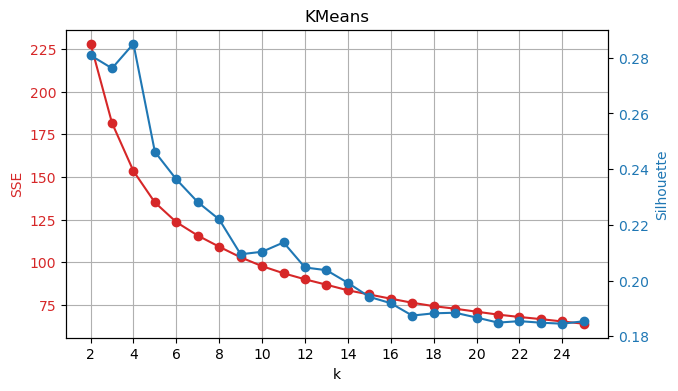

In [21]:
fig, ax1 = plt.subplots(figsize=(7,4))
# Plot per SSE sull'asse y sinistro
color = 'tab:red'
ax1.set_title('KMeans')
ax1.set_xlabel('k')
ax1.set_xticks(np.arange(0, np.array(Kv1).max(),2))
ax1.set_ylabel('SSE', color=color)
ax1.plot(Kv1, sse_list, marker='o', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Creazione di un secondo asse y per Silhouette sull'asse destro
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Silhouette', color=color)
ax2.plot(Kv1, silu_list, marker='o', color=color)
ax2.tick_params(axis='y', labelcolor=color)

# Aggiunta della griglia
ax1.grid()

# Mostra il grafico
plt.show()

In [22]:
kmeans = KMeans(init='k-means++', n_clusters=8, n_init=50, max_iter=300)
kmeans.fit(df_KM)
hist, bins = np.histogram(kmeans.labels_, bins=range(0, len(set(kmeans.labels_)) + 1))
label_perc=dict(zip(bins, np.round(hist/len(df),2)))
print('labels', label_perc)
print('sse', kmeans.inertia_)
print('silhouette', silhouette_score(df_KM, kmeans.labels_))

labels {0: 0.06, 1: 0.18, 2: 0.18, 3: 0.11, 4: 0.15, 5: 0.15, 6: 0.09, 7: 0.08}
sse 109.09964340286355
silhouette 0.22181754179280605


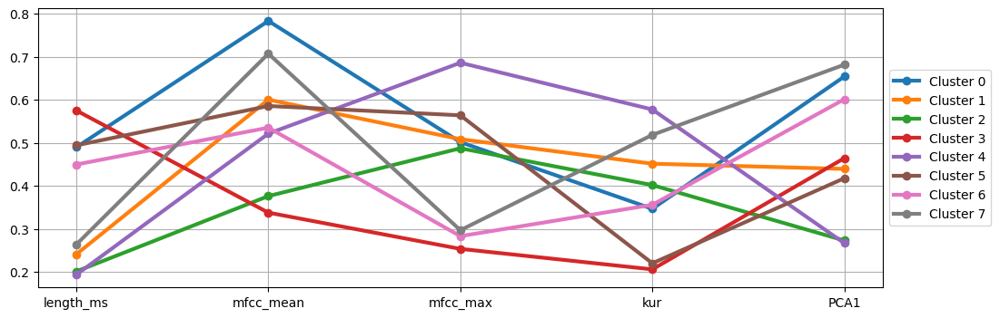

In [23]:
N_att = len(list(df_KM.columns))
plt.figure(figsize=(12,4))
for i in range(len(kmeans.cluster_centers_)):
    plt.plot(range(0, N_att), kmeans.cluster_centers_[i], label='Cluster %s' % i, linewidth=3, marker = 'o')
plt.xticks(range(0, N_att), list(df_KM.columns))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid()
plt.show()

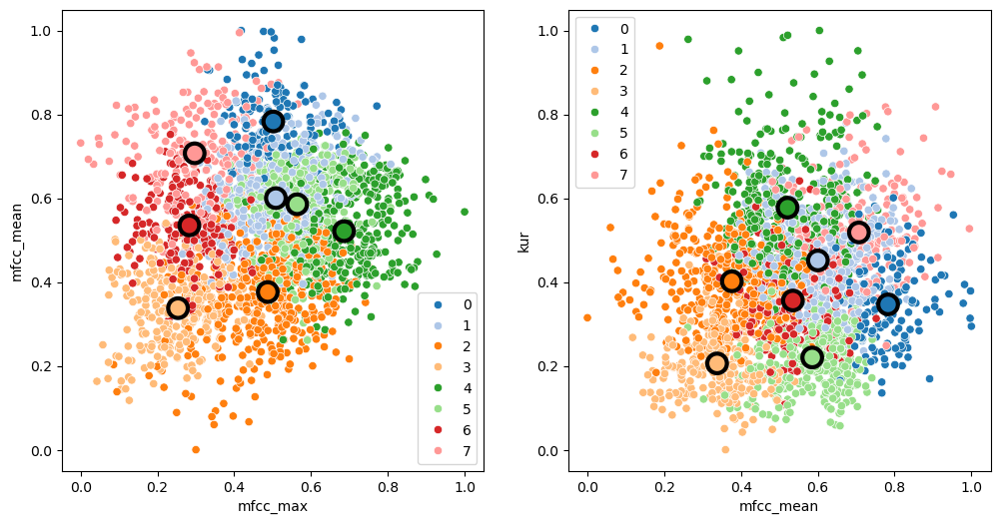

In [24]:

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
# Traccia lo scatter plot dei dati con colori basati sui cluster
sns.scatterplot(data=df_KM, x='mfcc_max', y='mfcc_mean', hue=kmeans.labels_, palette='tab20', ax=axs[0])#,style=kmeans.labels_)
# Traccia i centroidi dei cluster con gli stessi colori dei punti
axs[0].scatter(kmeans.cluster_centers_[:, 2], kmeans.cluster_centers_[:, 1], marker='o', linewidths=3, edgecolor='black', color=sns.color_palette('tab20')[:len(label_perc)], s=200)



# Traccia lo scatter plot dei dati con colori basati sui cluster
sns.scatterplot(data=df_KM, x='mfcc_mean', y='kur', hue=kmeans.labels_, palette='tab20', ax=axs[1])#,style=kmeans.labels_)
# Traccia i centroidi dei cluster con gli stessi colori dei punti
axs[1].scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 3], marker='o', linewidths=3, edgecolor='black', color=sns.color_palette('tab20')[:len(label_perc)], s=200)

plt.show()

In [25]:
from sklearn.metrics.pairwise import euclidean_distances
# Funzione per calcolare la matrice di similarità
def compute_similarity_matrix(df):
    # Converti il DataFrame in un array numpy
    X = df.to_numpy()
    # Utilizza la distanza euclidea come misura di similarità
    similarity_matrix = 1 / (1 + euclidean_distances(X))
    return similarity_matrix

# Funzione per ordinare la matrice di similarità per label di appartenenza
def order_similarity_matrix_by_label(similarity_matrix, labels):
    unique_labels = np.unique(labels)
    ordered_indices = np.concatenate([np.where(labels == label)[0] for label in unique_labels])
    ordered_similarity_matrix = similarity_matrix[ordered_indices][:, ordered_indices]
    return ordered_similarity_matrix




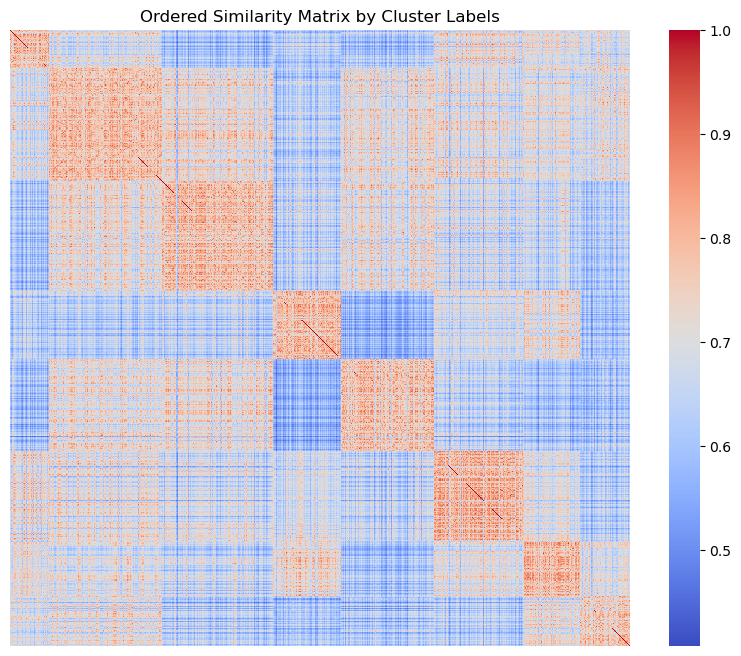

In [26]:
# Esempio di utilizzo
# Supponiamo che 'df' sia il tuo DataFrame e 'labels' siano le etichette di cluster corrispondenti ai punti nel DataFrame

# Calcola la matrice di similarità
similarity_matrix = compute_similarity_matrix(df_KM)

# Ordina la matrice di similarità per label di appartenenza
ordered_similarity_matrix = order_similarity_matrix_by_label(similarity_matrix, kmeans.labels_)

# Visualizza la matrice di similarità ordinata come heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(ordered_similarity_matrix, cmap='coolwarm')
plt.title('Ordered Similarity Matrix by Cluster Labels')
plt.xticks([])
plt.yticks([])
plt.show()

In [27]:
df_clusters_KM = df_KM.copy()
df_clusters_KM['Labels'] = kmeans.labels_

In [28]:
pemotion_xt_KM = pd.crosstab(df_clusters_KM['Labels'], df['emotion'])
psex_xt_KM = pd.crosstab(df_clusters_KM['Labels'], df['sex'])

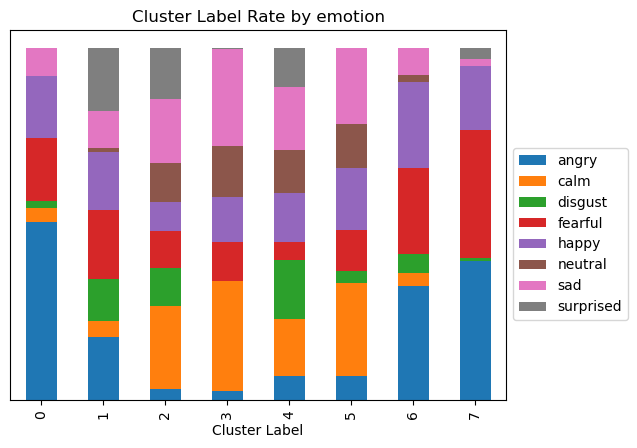

In [29]:
pemotion_xt_KM_pct = pemotion_xt_KM.div(pemotion_xt_KM.sum(1).astype(float), axis=0)
pemotion_xt_KM_pct.plot(kind='bar', stacked=True, title='Cluster Label Rate by emotion')
plt.xlabel('Cluster Label')
plt.ylabel('')
plt.yticks([])
plt.legend(bbox_to_anchor=(1,0.7))
plt.show()

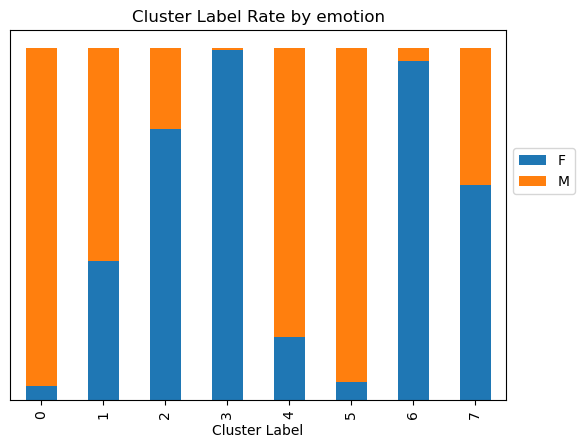

In [30]:
psex_xt_KM_pct = psex_xt_KM.div(psex_xt_KM.sum(1).astype(float), axis=0)
psex_xt_KM_pct.plot(kind='bar', stacked=True, title='Cluster Label Rate by emotion')
plt.xlabel('Cluster Label')
plt.ylabel('')
plt.yticks([])
plt.legend(bbox_to_anchor=(1,0.7))
plt.show()

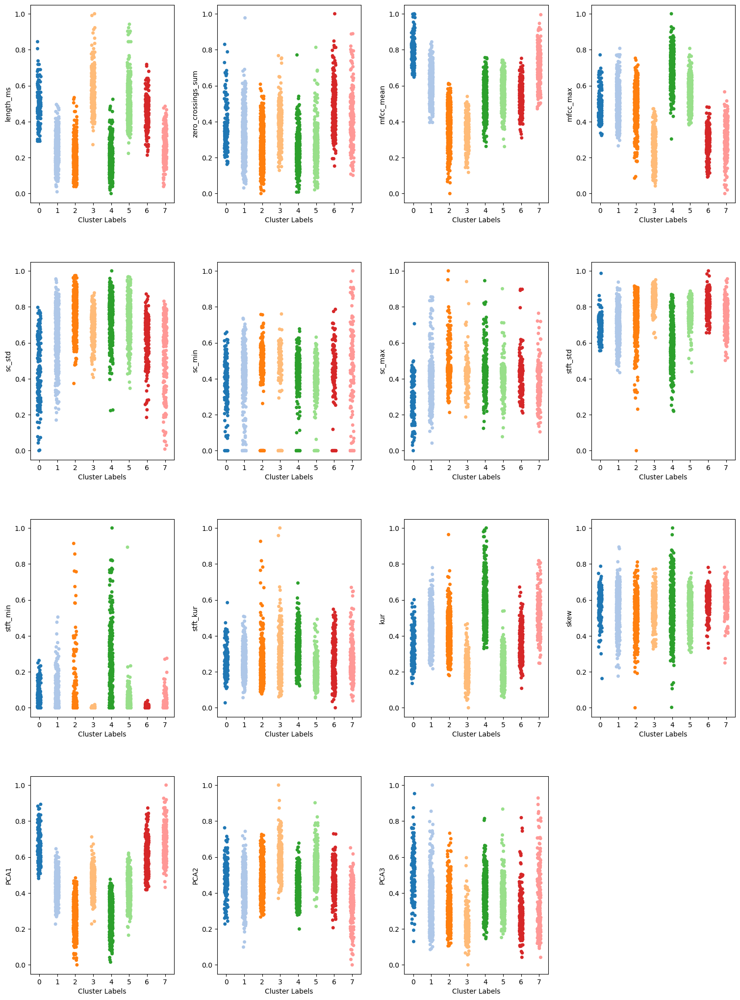

In [31]:
j = 0
i=0
fig, axs = plt.subplots(4, 4, figsize=(25, 25))
for c in df_KM_tot.columns:
    sns.stripplot(data=df_KM_tot, x=kmeans.labels_, y=c, ax=axs[j,i], hue=kmeans.labels_, palette='tab20', legend=None)
    axs[j, i].set_xlabel('Cluster Labels')
    i += 1
    if i%4==0:
        j+=1
        i=0

# Regola lo spazio del layout dei sottoplot per far spazio alla legenda
plt.subplots_adjust(right=0.7, top=0.9, wspace=0.3, hspace=0.3)

axs[3,3].axis('off')

plt.show()

Caso $k=4$

In [32]:
kmeans = KMeans(init='k-means++', n_clusters=4, n_init=50, max_iter=300)
kmeans.fit(df_KM)
hist, bins = np.histogram(kmeans.labels_, bins=range(0, len(set(kmeans.labels_)) + 1))
label_perc=dict(zip(bins, np.round(hist/len(df),2)))
print('labels', label_perc)
print('sse', kmeans.inertia_)
print('silhouette', silhouette_score(df_KM, kmeans.labels_))

labels {0: 0.22, 1: 0.16, 2: 0.2, 3: 0.42}
sse 153.46137728783532
silhouette 0.28501740745201753


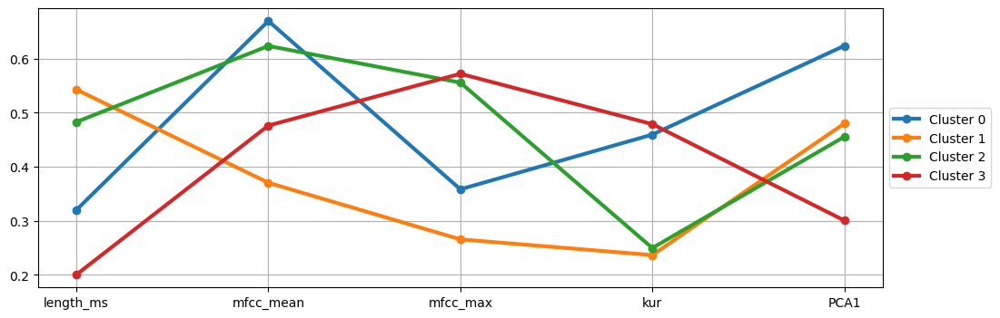

In [33]:
N_att = len(list(df_KM.columns))
plt.figure(figsize=(12,4))
for i in range(len(kmeans.cluster_centers_)):
    plt.plot(range(0, N_att), kmeans.cluster_centers_[i], label='Cluster %s' % i, linewidth=3, marker = 'o')
plt.xticks(range(0, N_att), list(df_KM.columns))
plt.grid()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

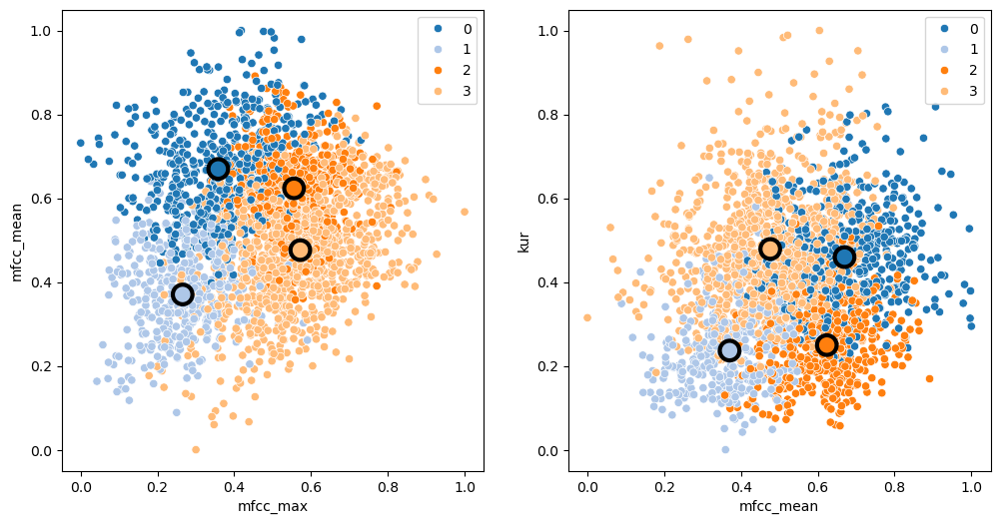

In [34]:

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
# Traccia lo scatter plot dei dati con colori basati sui cluster
sns.scatterplot(data=df_KM, x='mfcc_max', y='mfcc_mean', hue=kmeans.labels_, palette='tab20', ax=axs[0])#,style=kmeans.labels_)
# Traccia i centroidi dei cluster con gli stessi colori dei punti
axs[0].scatter(kmeans.cluster_centers_[:, 2], kmeans.cluster_centers_[:, 1], marker='o', linewidths=3, edgecolor='black', color=sns.color_palette('tab20')[:len(label_perc)], s=200)



# Traccia lo scatter plot dei dati con colori basati sui cluster
sns.scatterplot(data=df_KM, x='mfcc_mean', y='kur', hue=kmeans.labels_, palette='tab20', ax=axs[1])#,style=kmeans.labels_)
# Traccia i centroidi dei cluster con gli stessi colori dei punti
axs[1].scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 3], marker='o', linewidths=3, edgecolor='black', color=sns.color_palette('tab20')[:len(label_perc)], s=200)

# Mostra il plot
plt.show()

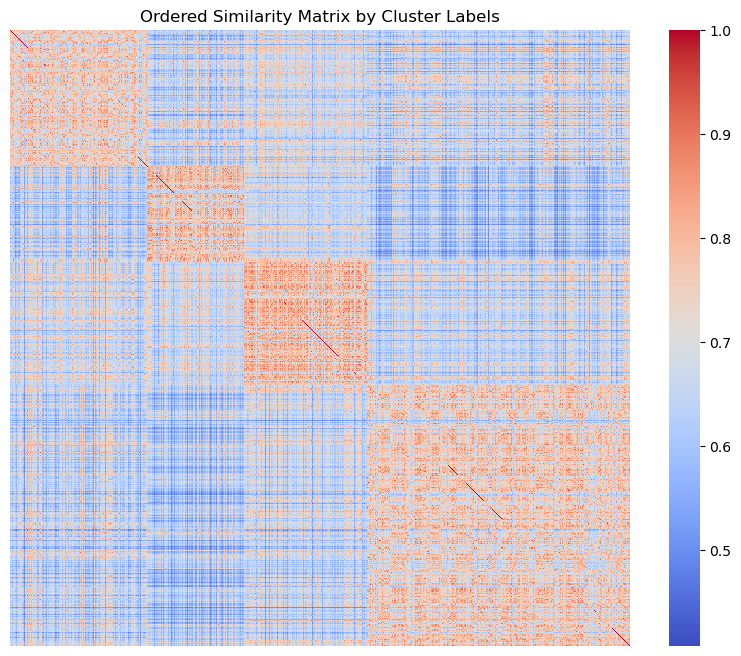

In [35]:
# Esempio di utilizzo
# Supponiamo che 'df' sia il tuo DataFrame e 'labels' siano le etichette di cluster corrispondenti ai punti nel DataFrame

# Calcola la matrice di similarità
similarity_matrix = compute_similarity_matrix(df_KM)

# Ordina la matrice di similarità per label di appartenenza
ordered_similarity_matrix = order_similarity_matrix_by_label(similarity_matrix, kmeans.labels_)

# Visualizza la matrice di similarità ordinata come heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(ordered_similarity_matrix, cmap='coolwarm')
plt.title('Ordered Similarity Matrix by Cluster Labels')
plt.xticks([])
plt.yticks([])
plt.show()

***
***

### **DBSCAN**

In [36]:
df_DBs = df_scaler_clust.iloc[:, numColumnsPos].copy()

In [37]:
df_DBs_tot=rimoz_outliers(df_DBs.copy(), 1)
#df_DBs_tot.drop(columns=['sc_min'],inplace=True)
df_DBs_tot.columns

Index(['length_ms', 'mfcc_mean', 'mfcc_max', 'sc_min', 'kur', 'PCA1'], dtype='object')

In [38]:
def dbscan_k_eps(df, k, type_dist):
    dist = pdist(df, type_dist)
    dist = squareform(dist)
    kth_distances = []
    for d in dist:  # d è un vettore che contiene le distanze tra l'ith record e tutti gli altri
        index_kth_distance = np.argsort(d)[k]  # prende l'indice del kth nearest neighbor
        kth_distances.append(d[index_kth_distance])
    eps_ok=sorted(kth_distances)[(np.array(range(0, len(kth_distances)))>len(kth_distances)*0.75).astype(int).argmax()]
    return k, eps_ok

In [39]:
# generiamo un loop che esegue il DBSCAN sul dataframe df_DBs_tot con range di valori kk e inserisce nelle liste sil_DB e punti_noise rispettivamente i punteggi della silhouette e i punti di rumore
t_dist='euclidean'
sil_DB = []
punti_noise = []
Kv1 = np.arange(2,30,1)
for kk in Kv1:
    k , eps1 = dbscan_k_eps(df_DBs_tot, kk, t_dist)
    dbscan = DBSCAN(eps=eps1, min_samples=k, metric='euclidean')
    dbscan.fit(df_DBs_tot)
    temp, N_noise = np.unique(dbscan.labels_[dbscan.labels_!=-1], return_counts=True)
    punti_noise.append(len(temp))
    sil_DB.append(silhouette_score(df_DBs_tot, dbscan.labels_))

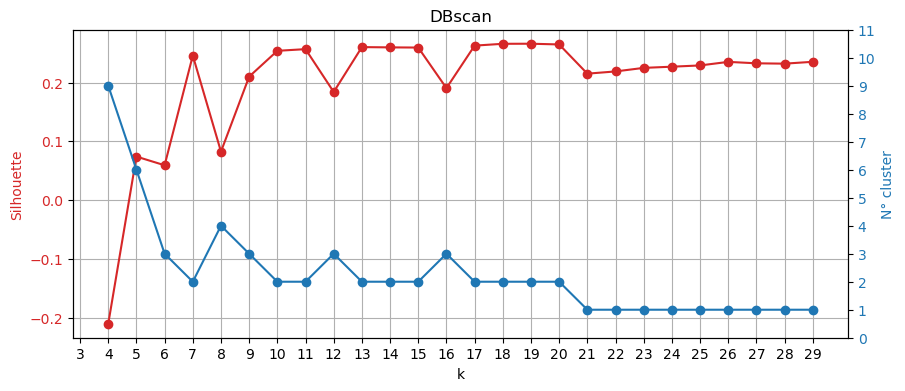

In [40]:
fig, ax1 = plt.subplots(figsize=(10,4))
# Plot per SSE sull'asse y sinistro
color = 'tab:red'
ax1.set_title('DBscan')
ax1.set_xlabel('k')
ax1.set_xticks(Kv1)
ax1.set_ylabel('Silhouette', color=color)
ax1.plot(Kv1[2:], sil_DB[2:], marker='o', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# Creazione di un secondo asse y per Silhouette sull'asse destro
ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('N° cluster', color=color)
ax2.plot(Kv1[2:], punti_noise[2:], marker='o', color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_yticks(np.arange(0,12,1))

# Aggiunta della griglia
ax1.grid()

# Mostra il grafico
plt.show()

In [41]:
k , eps = dbscan_k_eps(df_DBs_tot, 10, 'euclidean')
dbscan = DBSCAN(eps=eps, min_samples=k, metric='euclidean')
dbscan.fit(df_DBs_tot)

N_cluster_DBs, conteggi = np.unique(dbscan.labels_[dbscan.labels_!=-1], return_counts=True)
N_cluster_DBs_noise, conteggi_noise = np.unique(dbscan.labels_[dbscan.labels_==-1], return_counts=True)
print('Numero di cluster trovati:' , len(N_cluster_DBs))
for valore, count in zip(N_cluster_DBs, conteggi):
    print(f"Cluster: {valore}, N° record: {count}")

print(f"N° Noise record: {conteggi_noise[0]}")

Numero di cluster trovati: 2
Cluster: 0, N° record: 986
Cluster: 1, N° record: 1260
N° Noise record: 200


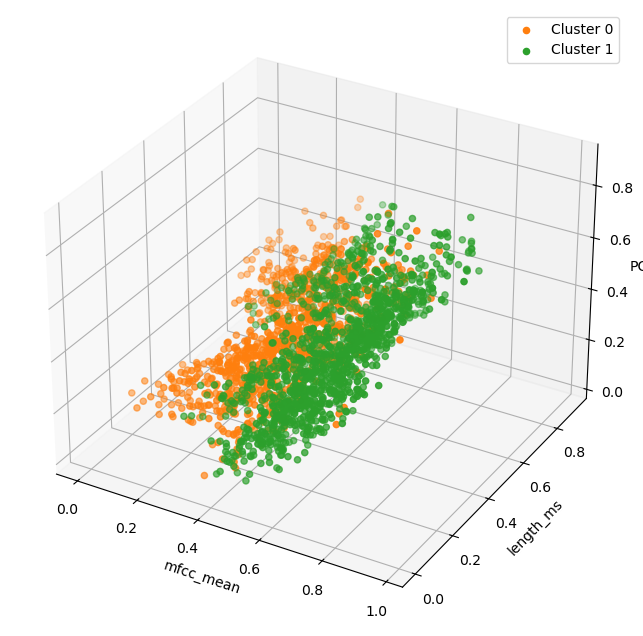

In [42]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')
for label in np.unique(dbscan.labels_):
    idx = dbscan.labels_ == label
    if label == -1:
        pass
    else:
        ax.scatter( df_DBs_tot['mfcc_mean'][idx],df_DBs_tot['length_ms'][idx],df_DBs_tot['PCA1'][idx],c=sns.color_palette('tab10')[label+1], marker='o', label=f'Cluster {label}')
ax.legend()
ax.set_ylabel('length_ms')
ax.set_xlabel('mfcc_mean')
ax.set_zlabel('PCA1')

plt.show()


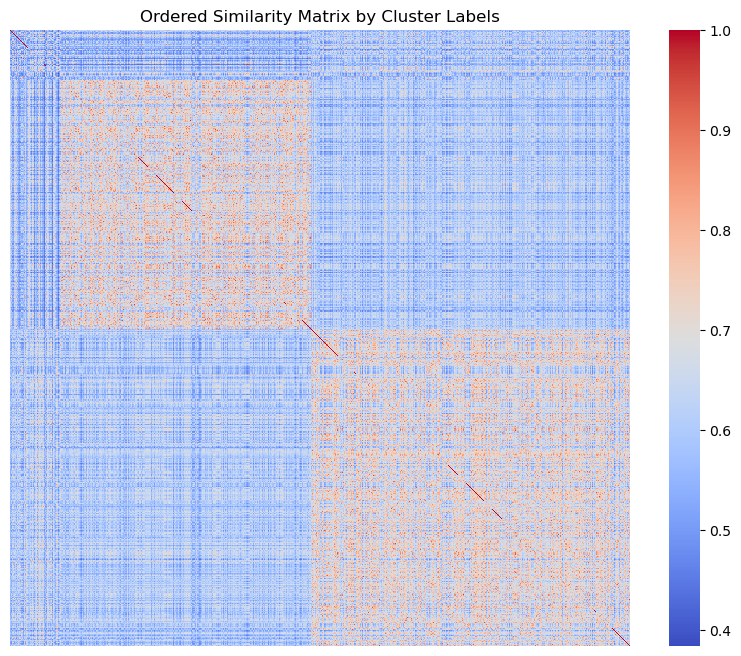

In [43]:
# Funzione per calcolare la matrice di similarità
# Esempio di utilizzo
# Supponiamo che 'df' sia il tuo DataFrame e 'labels' siano le etichette di cluster corrispondenti ai punti nel DataFrame

# Calcola la matrice di similarità
similarity_matrix = compute_similarity_matrix(df_DBs_tot)

# Ordina la matrice di similarità per label di appartenenza
ordered_similarity_matrix = order_similarity_matrix_by_label(similarity_matrix, dbscan.labels_)

# Visualizza la matrice di similarità ordinata come heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(ordered_similarity_matrix, cmap='coolwarm')
plt.title('Ordered Similarity Matrix by Cluster Labels')
plt.xticks([])
plt.yticks([])
plt.show()

IL DBscan è pessimo poichè i dati sono troppo concentrati è c'è solo una zona ad altissima densità

***
***

### **Hierarchical**

In [44]:
df_ger = df_scaler_clust.iloc[:, numColumnsPos].copy()

In [45]:
df_ger_tot=rimoz_outliers(df_ger.copy(), 1)
df_ger_tot.columns

Index(['length_ms', 'mfcc_mean', 'mfcc_max', 'sc_min', 'kur', 'PCA1'], dtype='object')

In [46]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

***

**Euclidean**

In [47]:
metrica = 'euclidean'

In [48]:
# salviamo le silhouette dei cluster gerarchici effettuati con metrica 'euclidea' per diversi tipi di linkage =['complete', 'ward', 'complete', 'single']
ys_c = []
ys_s = []
ys_avg = []
ys_w = []
max = 20
for k in np.arange(2,max):

    model_comp = AgglomerativeClustering(n_clusters=k, linkage='complete', metric=metrica)
    model_w = AgglomerativeClustering(n_clusters=k, linkage='ward', metric=metrica)
    model_avg = AgglomerativeClustering(n_clusters=k, linkage='average', metric=metrica)
    model_sing = AgglomerativeClustering(n_clusters=k, linkage='single', metric=metrica)

    model_comp = model_comp.fit(df_ger_tot)
    model_avg = model_avg.fit(df_ger_tot)
    model_w = model_w.fit(df_ger_tot)
    model_sing = model_sing.fit(df_ger_tot)

    ys_c.append(silhouette_score(df_ger_tot,  model_comp.labels_))
    ys_s.append(silhouette_score(df_ger_tot,  model_sing.labels_))
    ys_avg.append(silhouette_score(df_ger_tot,  model_avg.labels_))
    ys_w.append(silhouette_score(df_ger_tot,  model_w.labels_))


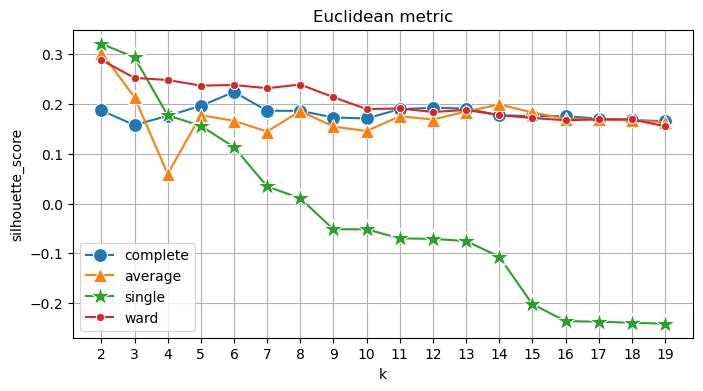

In [49]:
plt.figure(figsize=(8, 4))
plt.title('Euclidean metric')
sns.lineplot(x=np.arange(2,max), y=ys_c, marker='o', label='complete',markersize=10 )
sns.lineplot(x=np.arange(2,max), y=ys_avg, marker='^', label='average', markersize=10)
sns.lineplot(x=np.arange(2,max), y=ys_s, marker='*', label='single', markersize=15)
sns.lineplot(x=np.arange(2,max), y=ys_w, marker='o', label='ward')
plt.ylabel('silhouette_score')
plt.xlabel('k')
plt.grid()
plt.xticks(np.arange(2,max))
plt.legend()
plt.show()

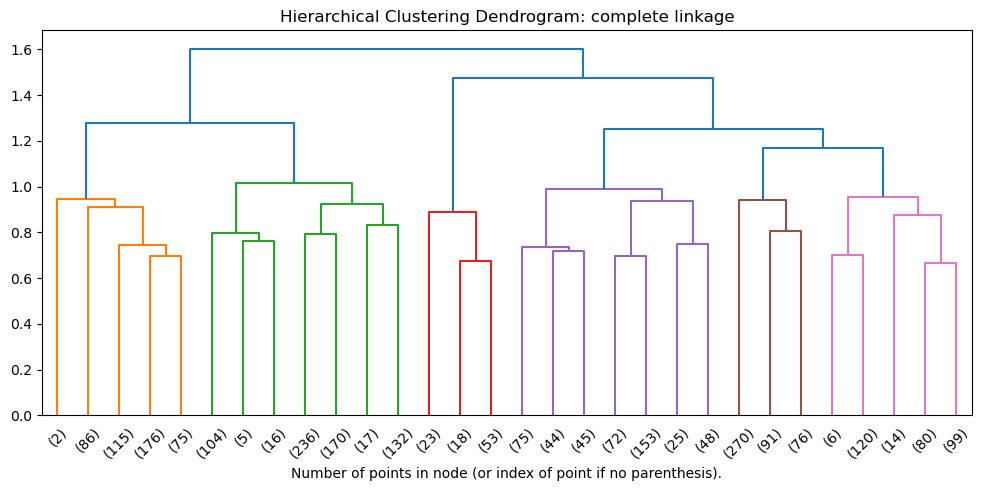

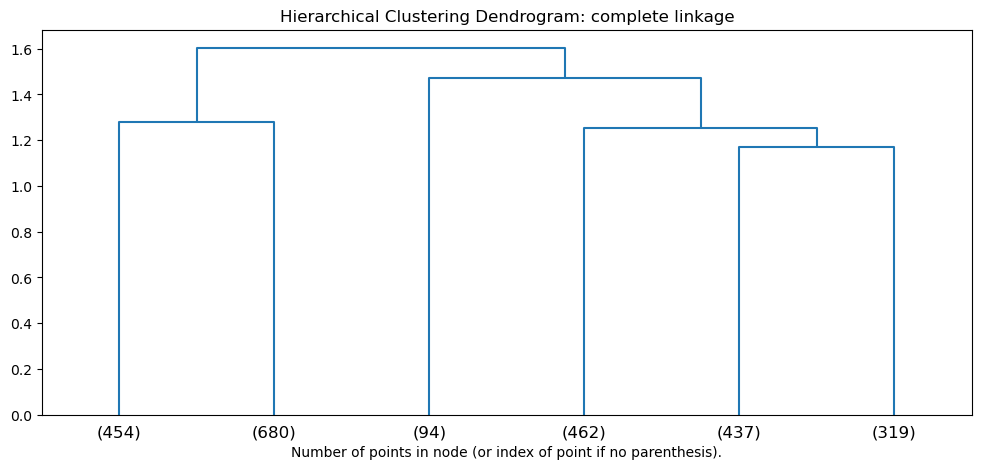

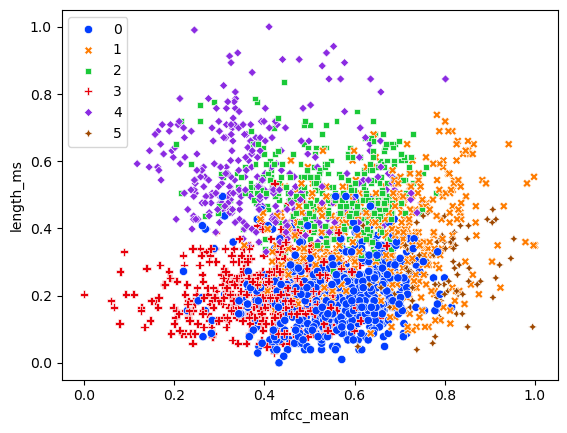

In [50]:
# settare la distance_threschold=0 permette che venga computato l'intero albero
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric=metrica, linkage='complete', compute_distances=True)
model = model.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: complete linkage")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


model_comp_euclid = AgglomerativeClustering(n_clusters=6, metric=metrica, linkage='complete', compute_distances=True)
model_comp_euclid = model_comp_euclid.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: complete linkage")
plot_dendrogram(model_comp_euclid, truncate_mode="lastp", p=6)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

sns.scatterplot(data=df_ger_tot, x='mfcc_mean', y='length_ms', hue=model_comp_euclid.labels_, style=model_comp_euclid.labels_, palette="bright")
plt.show()




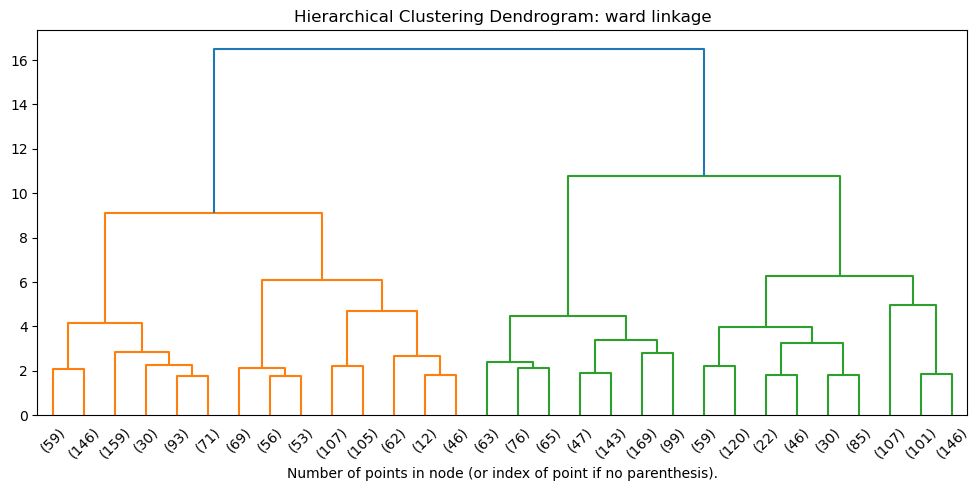

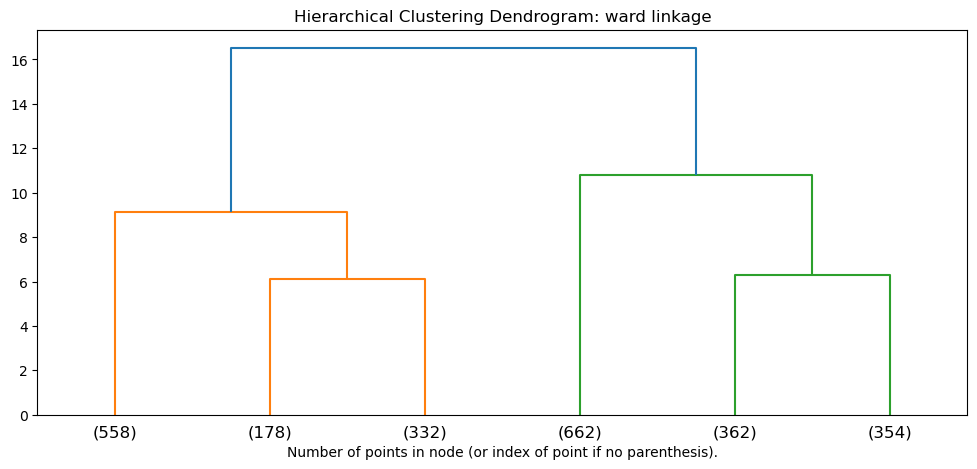

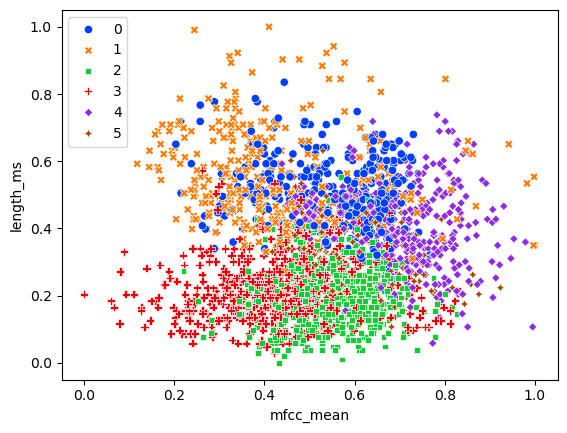

In [51]:
# settare la distance_threschold=0 permette che venga computato l'intero albero
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric=metrica, linkage='ward', compute_distances=True)
model = model.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: ward linkage")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


model_comp_euclid = AgglomerativeClustering(n_clusters=6, metric=metrica, linkage='ward', compute_distances=True)
model_comp_euclid = model_comp_euclid.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: ward linkage")
plot_dendrogram(model_comp_euclid, truncate_mode="lastp", p=6)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

sns.scatterplot(data=df_ger_tot, x='mfcc_mean', y='length_ms', hue=model_comp_euclid.labels_, style=model_comp_euclid.labels_, palette="bright")
plt.show()



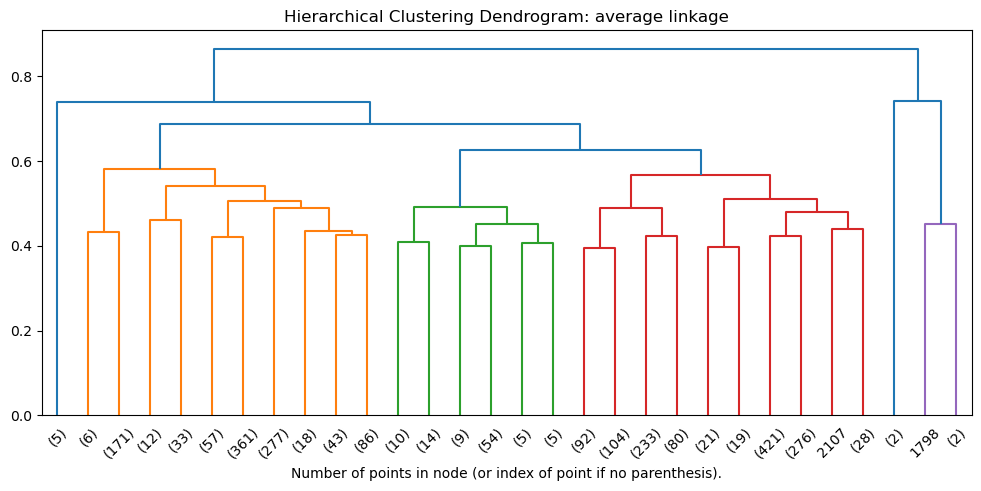

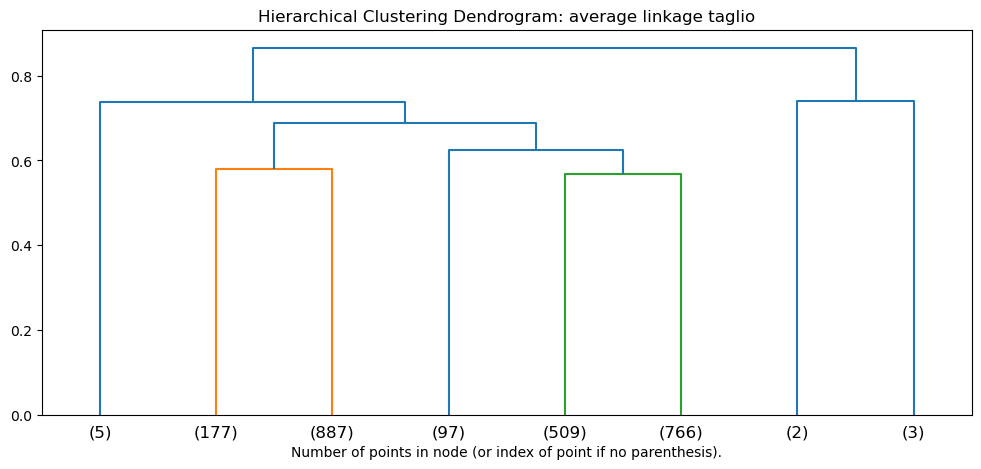

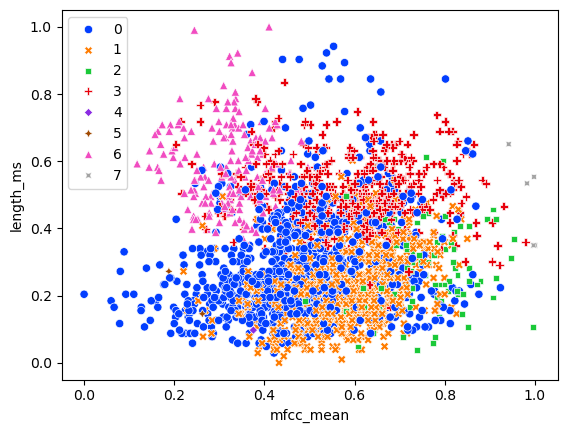

In [52]:
# settare la distance_threschold=0 permette che venga computato l'intero albero
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric=metrica, linkage='average', compute_distances=True)
model = model.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: average linkage")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


model_comp_euclid = AgglomerativeClustering(n_clusters=8, metric=metrica, linkage='average', compute_distances=True)
model_comp_euclid = model_comp_euclid.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: average linkage taglio")
plot_dendrogram(model_comp_euclid, truncate_mode="lastp", p=8)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

sns.scatterplot(data=df_ger_tot, x='mfcc_mean', y='length_ms', hue=model_comp_euclid.labels_, style=model_comp_euclid.labels_, palette="bright")
plt.show()



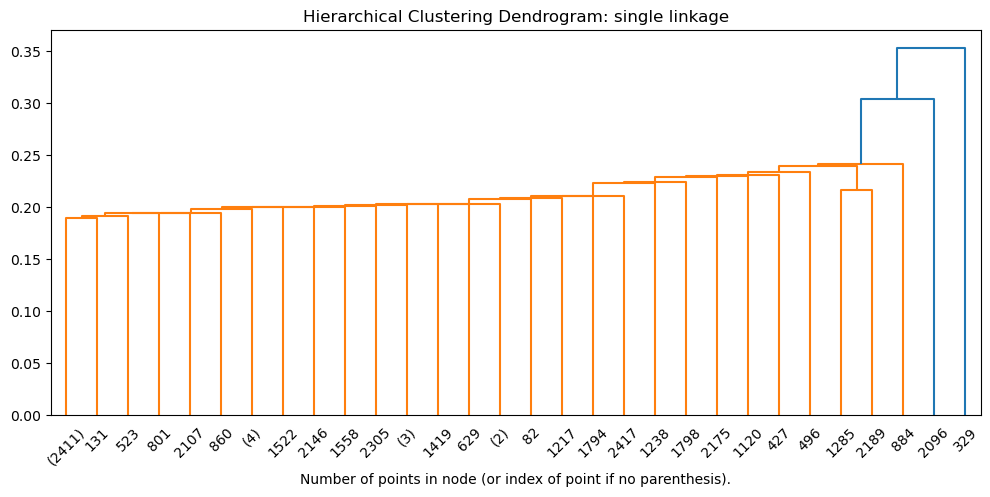

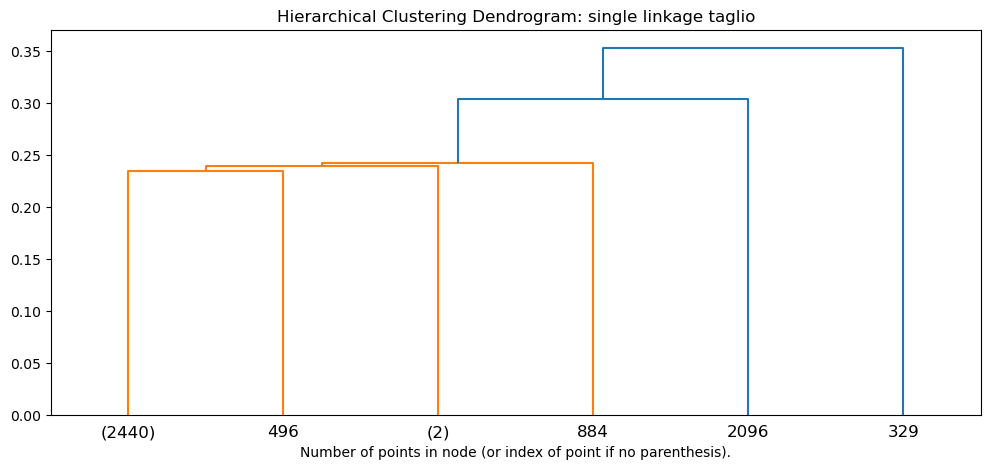

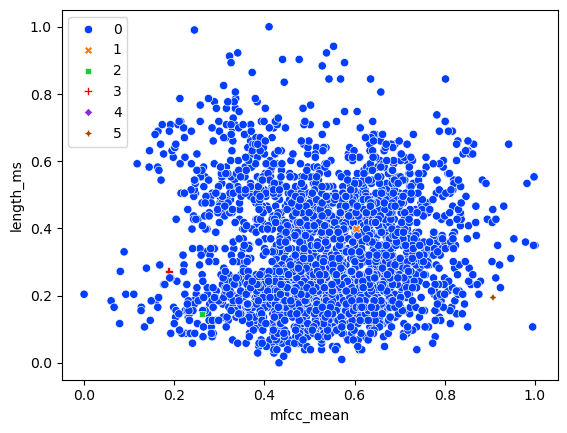

In [53]:
# settare la distance_threschold=0 permette che venga computato l'intero albero
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric=metrica, linkage='single', compute_distances=True)
model = model.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: single linkage")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


model_comp_euclid = AgglomerativeClustering(n_clusters=6, metric=metrica, linkage='single', compute_distances=True)
model_comp_euclid = model_comp_euclid.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: single linkage taglio")
plot_dendrogram(model_comp_euclid, truncate_mode="lastp", p=6)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

sns.scatterplot(data=df_ger_tot, x='mfcc_mean', y='length_ms', hue=model_comp_euclid.labels_, style=model_comp_euclid.labels_, palette="bright")
plt.show()



***

**Cityblock**

In [54]:
metrica = 'cityblock'

In [55]:
ys_c = []
ys_s = []
ys_avg = []
max = 20
for k in np.arange(2,max):
    model_comp = AgglomerativeClustering(n_clusters=k, linkage='complete', metric=metrica)
    model_avg = AgglomerativeClustering(n_clusters=k, linkage='average', metric=metrica)
    model_sing = AgglomerativeClustering(n_clusters=k, linkage='single', metric=metrica)
    model_comp = model_comp.fit(df_ger_tot)
    model_avg = model_avg.fit(df_ger_tot)
    model_sing = model_sing.fit(df_ger_tot)
    ys_c.append(silhouette_score(df_ger_tot,  model_comp.labels_))
    ys_s.append(silhouette_score(df_ger_tot,  model_sing.labels_))
    ys_avg.append(silhouette_score(df_ger_tot,  model_avg.labels_))


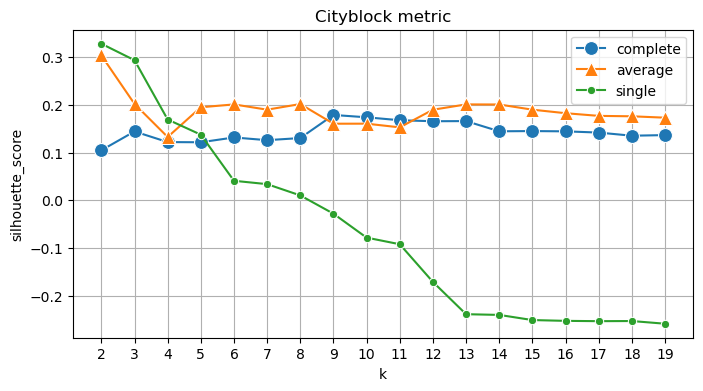

In [56]:
plt.figure(figsize=(8, 4))
plt.title('Cityblock metric')
sns.lineplot(x=np.arange(2,max), y=ys_c, marker='o', label='complete', markersize = 10)
sns.lineplot(x=np.arange(2,max), y=ys_avg, marker='^', label='average', markersize = 10)
sns.lineplot(x=np.arange(2,max), y=ys_s, marker='o', label='single')
plt.ylabel('silhouette_score')
plt.xlabel('k')
plt.grid()
plt.xticks(np.arange(2,max))
plt.legend()
plt.show()

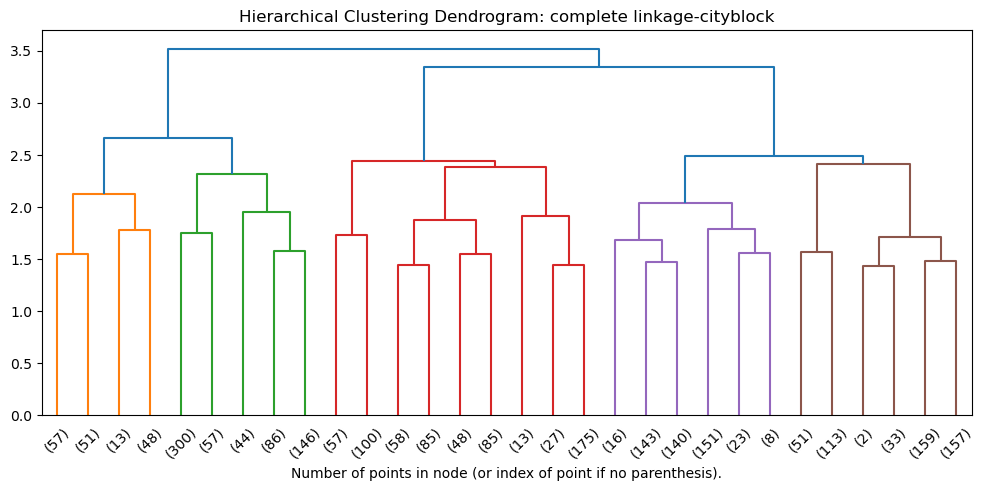

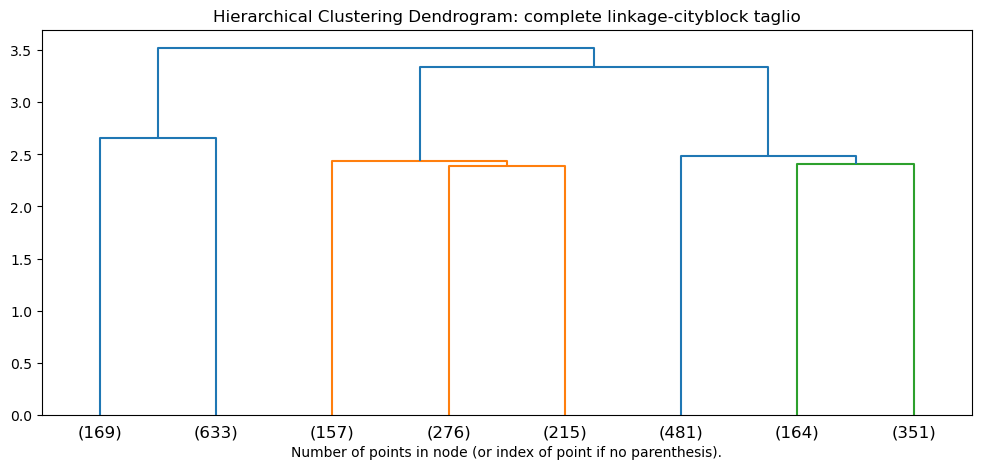

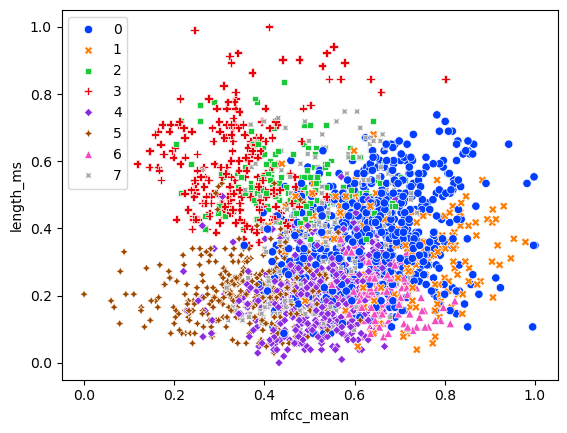

In [57]:
# settare la distance_threschold=0 permette che venga computato l'intero albero
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric=metrica, linkage='complete', compute_distances=True)
model = model.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: complete linkage-cityblock")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


model_comp_euclid = AgglomerativeClustering(n_clusters=8, metric=metrica, linkage='complete', compute_distances=True)
model_comp_euclid = model_comp_euclid.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: complete linkage-cityblock taglio")
plot_dendrogram(model_comp_euclid, truncate_mode="lastp", p=8)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

sns.scatterplot(data=df_ger_tot, x='mfcc_mean', y='length_ms', hue=model_comp_euclid.labels_, style=model_comp_euclid.labels_, palette="bright")
plt.show()




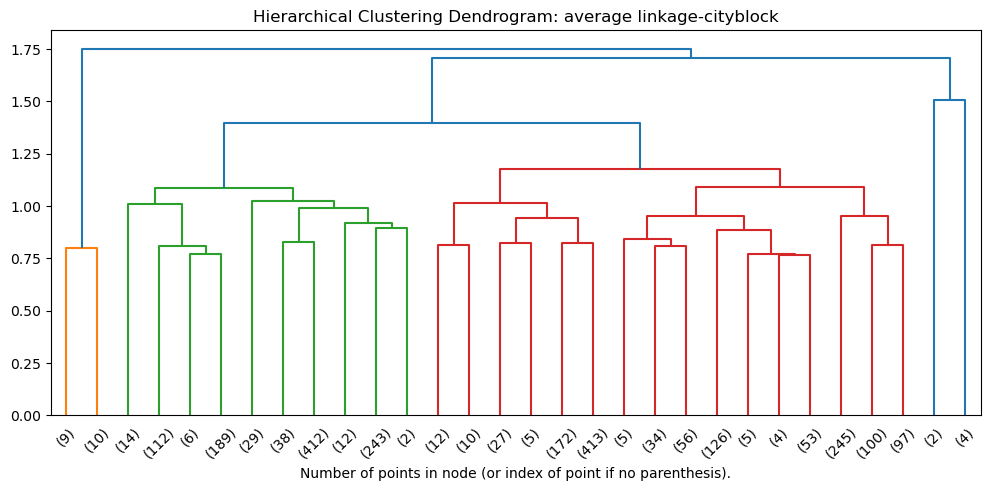

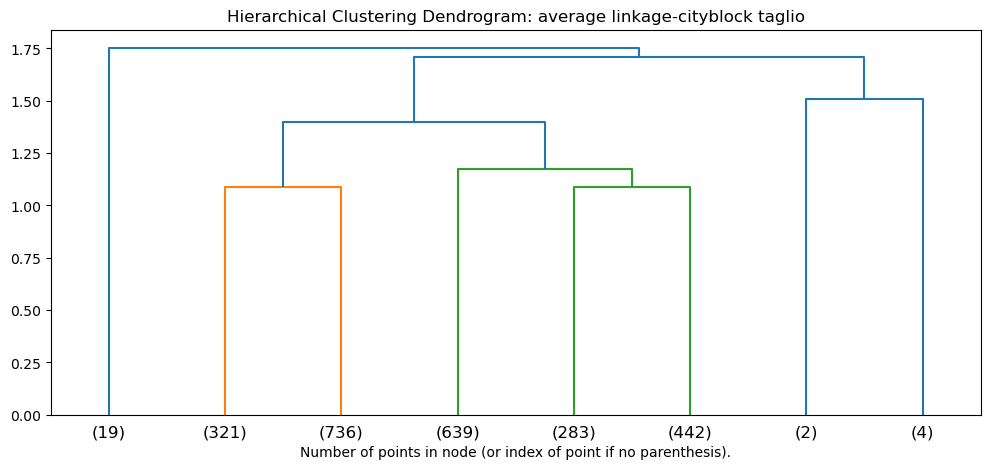

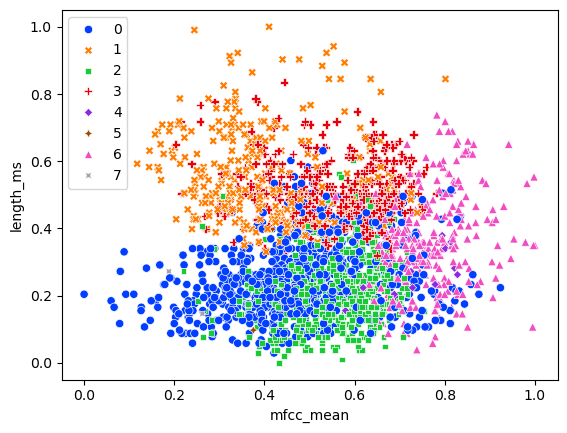

In [58]:
# settare la distance_threschold=0 permette che venga computato l'intero albero
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric=metrica, linkage='average', compute_distances=True)
model = model.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: average linkage-cityblock")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


model_comp_euclid = AgglomerativeClustering(n_clusters=8, metric=metrica, linkage='average', compute_distances=True)
model_comp_euclid = model_comp_euclid.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: average linkage-cityblock taglio")
plot_dendrogram(model_comp_euclid, truncate_mode="lastp", p=8)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

sns.scatterplot(data=df_ger_tot, x='mfcc_mean', y='length_ms', hue=model_comp_euclid.labels_, style=model_comp_euclid.labels_, palette="bright")
plt.show()




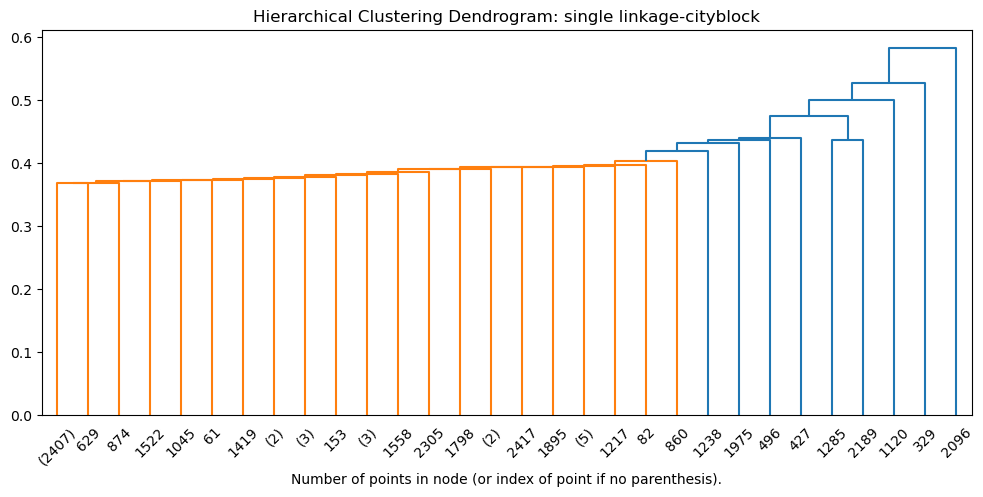

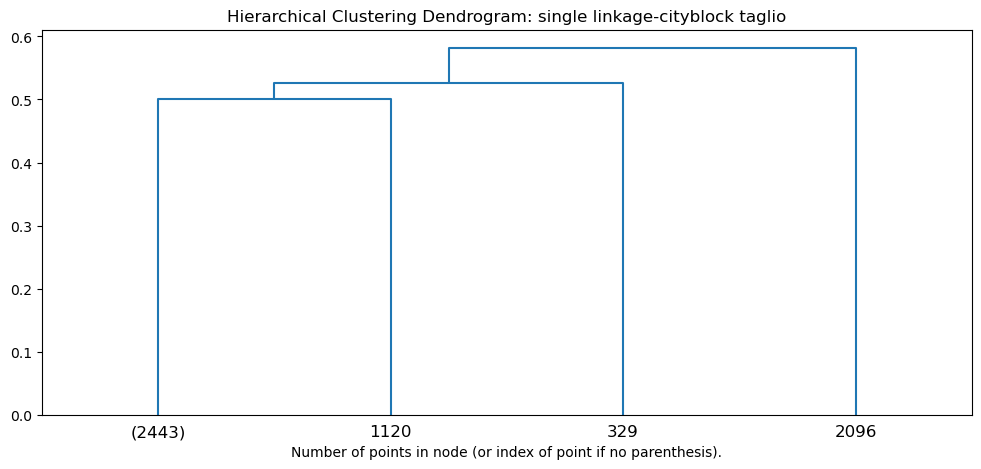

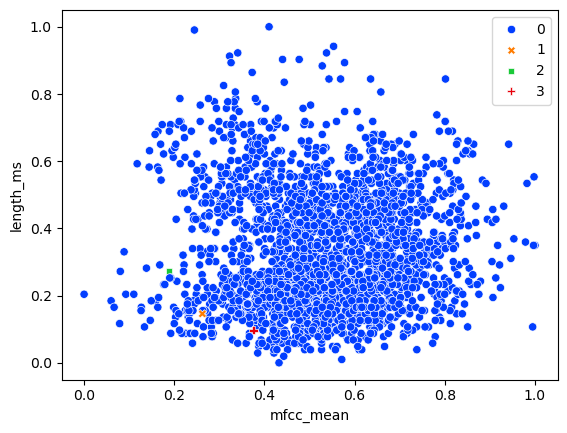

In [59]:
# settare la distance_threschold=0 permette che venga computato l'intero albero
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric=metrica, linkage='single', compute_distances=True)
model = model.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: single linkage-cityblock")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()


model_comp_euclid = AgglomerativeClustering(n_clusters=4, metric=metrica, linkage='single', compute_distances=True)
model_comp_euclid = model_comp_euclid.fit(df_ger_tot)

plt.figure(figsize=(12,5))
plt.title("Hierarchical Clustering Dendrogram: single linkage-cityblock taglio")
plot_dendrogram(model_comp_euclid, truncate_mode="lastp", p=4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

sns.scatterplot(data=df_ger_tot, x='mfcc_mean', y='length_ms', hue=model_comp_euclid.labels_, style=model_comp_euclid.labels_, palette="bright")
plt.show()



***